# EDA (Exploration Data Analysis)

In [1]:
#@title Define if we are on Colab and mount drive { display-mode: "form" }
try:
  from google.colab import drive
  drive.mount('/content/gdrive')
  IN_COLAB = True
except:
  IN_COLAB = False

In [2]:
#@title (COLAB ONLY) Clone GitHub repo { display-mode: "form" }

if IN_COLAB:
  !git clone https://github.com/lluissalord/radiology_ai.git

  %cd radiology_ai

In [3]:
#@title Setup environment and Colab general variables { display-mode: "form" }
%%capture
%run colab_setup.ipynb

In [4]:
from fastai.basics import *
from fastai.medical.imaging import *

import pandas as pd
import os
import matplotlib.pyplot as plt

from utils import df_check_DICOM, sample_df_check_DICOM, get_each_case_samples


Filename.........: E:/Google Drive/DICOMS/20040000183749/20200604.085023.798.42086.PACS2004
Storage type.....: 1.2.840.10008.5.1.4.1.1.1

Patient's name....: 1234, 
Patient id........: 1234
SeriesDescription.: rodilla (telemando) AP y LAT
Body Part Examined: KNEE
Presentation LUT Shape: INVERSE
Bits Stored: 15
Modality..........: CR
Study Date........: 20200604
Image size.......: 3420 x 4218, 28851120 bytes
Pixel spacing....: [0.1, 0.1]
Slice location...: (missing)


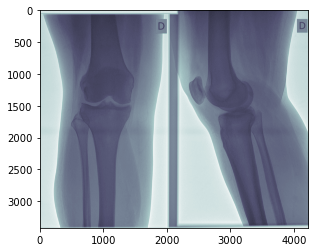

In [33]:
# filename = raw_folder + '/01010000265254/DN6HRHRGK7HVUeB1BJMI58TIKKAG41D1DU1P8U02CDN8FSGKRC0FK'
# filename = raw_folder + '/03010001176119/0EHKK04CBOO1Ee7BR8O3GTR4N0VG41DEQ1MEPG0B3CM1DOPN2LBKG'   # GDCM issue
filename = raw_folder + '/03010001140473/44EIARL2F5R93e6KUKCGCH0T5QBG41D06V8N940P0ALE12N6M6UDE'   # Inverse
# filename = raw_folder + '/03010001161180/6G2GP08CG0DA9eESVU607SHP50OG41D865OO5M020LHQ3GI2RDH6N'   # Prot Exam (to be deleted)
# filename = organize_folder + '/CD/0/01010000265254.dcm'
# filename = raw_folder + '/36030000376557/20200602.200621.233.354035.PACS3603'                     # Bits Stored -> 8
# filename = raw_folder + '/25010000745513/15JMRT6QFQLC1e3FEDVIO4AHGDFG41E731PRQO0EE1CT1K62H4LVQ'   # Bits Stored -> 10
# filename = raw_folder + '/20040000183749/20200604.085023.798.42086.PACS2004'                      # Bits Stored -> 15
# filename = raw_folder + '/08850002654834/00DUSLOJHH6IRe7B9LBHCM35C9FG41EA1SLAE2040QTR54BHRCG3S'   # Bits Stored -> 16
# filename = raw_folder + '/28180000184989/5R1L3SRR6IG93e979JJQS7D95BDG41DCJF6NC50TETSKRTPKONOJ7'   # Modality DR
# filename = raw_folder + '/45010000555562/3J9R99AAVO6GTe945AO28KVV1HGG41EAB3NF7902A4S1LOHA2AN3G'   # Modality DX
# filename = raw_folder + '/35030000293656/FS4UV5N3QMBFMe2MOO6CC7NU3D3G41DCHMQ6P30E0S0LPQKAK4AE5'   # Modality MR
# filename = raw_folder + '/08850002589826/54581U7S0N3RJeEICDQVJ1U4EPJG41DS771B330P6T0RIHUQMM0H8'   # Modality RF

dcm = dcmread(filename)

# Normal mode:
print()
print("Filename.........:", filename)
print("Storage type.....:", dcm.SOPClassUID)
print()

pat_name = dcm.PatientName
display_name = pat_name.family_name + ", " + pat_name.given_name
print("Patient's name....:", display_name)
print("Patient id........:", dcm.PatientID)
print("SeriesDescription.:", dcm.SeriesDescription)
print("Body Part Examined:", dcm.BodyPartExamined)
try:
    print("Presentation LUT Shape:", dcm.PresentationLUTShape)
except:
    pass
print("Bits Stored:", dcm.BitsStored)
print("Modality..........:", dcm.Modality)
print("Study Date........:", dcm.StudyDate)

if 'PixelData' in dcm:
    rows = int(dcm.Rows)
    cols = int(dcm.Columns)
    print("Image size.......: {rows:d} x {cols:d}, {size:d} bytes".format(
        rows=rows, cols=cols, size=len(dcm.PixelData)))
    if 'PixelSpacing' in dcm:
        print("Pixel spacing....:", dcm.PixelSpacing)

# use .get() if not sure the item exists, and want a default value if missing
print("Slice location...:", dcm.get('SliceLocation', "(missing)"))

# plot the image using matplotlib
plt.imshow(dcm.scaled_px, cmap=plt.cm.bone)
plt.show()

## Raw Data EDA

In [17]:
fnames = get_files(raw_folder)
df = pd.DataFrame.from_dicoms(
    fnames
)
df.T

█

,0,1,2,3,4,5,6,7,8,9,...,1728,1729,1730,1731,1732,1733,1734,1735,1736,1737
,16,16,16,16,16,16,16,16,16,16,...,b'LAT ',b'AP',b'AP',b'LAT ',b'AP',b'LAT ',b'LAT ',b'AP',b'LAT ',b'AP'
SpecificCharacterSet,ISO_IR 100,ISO_IR 100,ISO_IR 100,ISO_IR 100,ISO_IR 100,ISO_IR 100,ISO_IR 100,ISO_IR 100,ISO_IR 100,ISO_IR 100,...,ISO_IR 100,ISO_IR 100,ISO_IR 100,ISO_IR 100,ISO_IR 100,ISO_IR 100,ISO_IR 100,ISO_IR 100,ISO_IR 100,ISO_IR 100
ImageType,DERIVED,DERIVED,DERIVED,DERIVED,DERIVED,DERIVED,DERIVED,DERIVED,DERIVED,DERIVED,...,DERIVED,DERIVED,DERIVED,DERIVED,DERIVED,DERIVED,DERIVED,DERIVED,DERIVED,DERIVED
SOPClassUID,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,...,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1,1.2.840.10008.5.1.4.1.1.1
SOPInstanceUID,1216.1158.1243.113.1196.184.20190117113311.12,1216.1158.1243.113.1196.184.20190117113311.11,1216.1158.1243.113.1196.184.20190129103613.4,1216.1158.1243.113.1196.184.20190129103613.3,1216.1158.1243.113.1196.184.20190130113155.3,1216.1158.1243.113.1196.184.20190130113155.4,1216.1158.1243.113.1196.184.20190215174436.39,1216.1158.1243.113.1196.184.20190215174436.40,1216.1158.1243.113.1196.184.20190220113109.4,1216.1158.1243.113.1196.184.20190220113109.3,...,10.11.1247.1104.166.1128.202002200854250,10.11.1247.1104.166.1128.20200220085425,10.11.1247.1104.166.1128.20200221114806,10.11.1247.1104.166.1128.202002211148060,10.11.1247.1104.166.1128.20200221153633,10.11.1247.1104.166.1128.202002211536330,10.11.1247.1104.166.1128.202002211550170,10.11.1247.1104.166.1128.20200221155017,10.11.1247.1104.166.1128.202002211809540,10.11.1247.1104.166.1128.20200221180954
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DateOfLastDetectorCalibration,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TimeOfLastDetectorCalibration,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GridFocalDistance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MultiFieldOfViewDimensions,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
metadata_save_path = PATH_PREFIX + 'metadata_raw.csv'

In [17]:
df = pd.read_csv(metadata_save_path)
# df.to_csv(metadata_save_path)

In [20]:
df.ViewPosition.value_counts()

AP     384
LAT    382
OBL      9
PA       1
Name: ViewPosition, dtype: int64

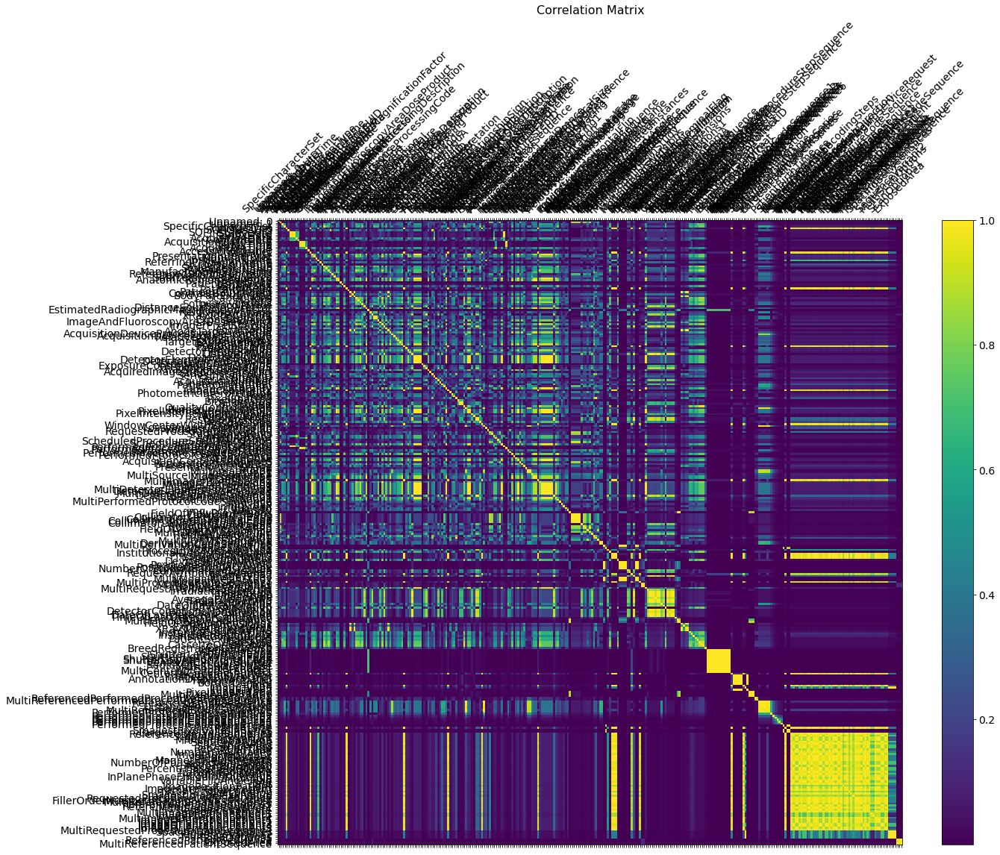

In [34]:
corr = df.astype('string').astype('category').apply(lambda x: x.cat.codes, axis=0).corr()

corr = corr.loc[corr.notnull().any(axis=0),corr.notnull().any(axis=1)].abs()

f = plt.figure(figsize=(19, 15))
plt.matshow(corr, fignum=f.number)
plt.xticks(range(corr.shape[1]), corr.columns, fontsize=14, rotation=45)
plt.yticks(range(corr.shape[1]), corr.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);
plt.show()

In [47]:
pd.set_option('max_rows', 100)
repr_flds = [
    'Modality',
    'BitsStored',
]
pivot_df = df.pivot_table(values=['img_mean','img_std','img_max','img_min','PatientID', 'fname'], index=repr_flds,
                   aggfunc={'img_mean':'mean','img_max':'max','img_min':'min', 'img_std':'mean','PatientID':'count', 'fname': 'max'})
display(pivot_df)

PatientID  \
Modality BitsStored              
CR       8                 597   
         10                  6   
         12              46695   
         15                200   
         16               1274   
DR       12                  2   
DX       12                  2   
MR       12                177   
RF       10                  1   

                                                                                                                            fname  \
Modality BitsStored                                                                                                                 
CR       8                             /content/gdrive/My Drive/Dataset/DICOMS/36030000376557/20200602.200621.233.354035.PACS3603   
         10          /content/gdrive/My Drive/Dataset/DICOMS/25010000745513/15JMRT6QFQLC1e3FEDVIO4AHGDFG41E731PRQO0EE1CT1K62H4LVQ   
         12          /content/gdrive/My Drive/Dataset/DICOMS/52010000114101/6D7RQI97KE05Oe7V44OBIRKCI6JG41EBE9SLVH0ECFF75QM6MPPE2   
         15                             /content/gdrive/My Drive/Dataset/DICOMS/20040000183749/20200604.085023.798.42086.PACS2004   
         16          /content/gdrive/My Drive/Dataset/DICOMS/14010001206676/971D0S613637GeDJQL12L3GADIAG41DV1NG0L00E4EC1E5O8DA0FL   
DR       12          /content/gdrive/My Drive/Dataset/DICOMS/28180000184989/5R1L3SRR6IG93e979JJQS7D95BDG41DCJF6NC50TETSKRTPKONOJ7   
DX       12          /content/gdrive/My Drive/Dataset/DICOMS/45010000555562/3J9R99AAVO6GTe945AO28KVV1HGG41EAB3NF7902A4S1LOHA2AN3G   
MR       12          /content/gdrive/My Drive/Dataset/DICOMS/35030000293656/FS4UV5N3QMBFMe2MOO6CC7NU3D3G41DCHMQ6P30E0S0LPQKAK4AE5   
RF       10          /content/gdrive/My Drive/Dataset/DICOMS/08850002589826/54581U7S0N3RJeEICDQVJ1U4EPJG41DS771B330P6T0RIHUQMM0H8   

                     img_max      img_mean  img_min      img_std  
Modality BitsStored                                               
CR       8               255     58.597918        0    69.640267  
         10             1023    797.783748        0   182.298432  
         12             4108   1679.086292        0   902.850076  
         15            32767  22500.425953        0  4489.050104  
         16            65535  17614.933217        0  9221.585750  
DR       12             4011   1434.497994      102   973.765950  
DX       12             4095   2462.047446        0   745.097560  
MR       12              966     67.646416        0    63.018431  
RF       10              850    315.657502        0   268.500017

In [7]:
pd.set_option('max_rows', 100)
repr_flds = [
    'SeriesDescription',
    'BodyPartExamined',
    # 'Modality',
    # 'StudyDescription',
    # 'ViewPosition',
    # 'AcquiredImageAreaDoseProduct'
]
pivot_df = df.pivot_table(values=['img_mean','img_std','img_max','img_min','PatientID', 'fname'], index=repr_flds,
                   aggfunc={'img_mean':'mean','img_max':'max','img_min':'min', 'img_std':'mean','PatientID':'count', 'fname': 'max'})
display(pivot_df)

,,PatientID,fname,img_max,img_mean,img_min,img_std
SeriesDescription,BodyPartExamined,,,,,,
AMBAS MANOS,HAND,3,data\DICOMS\03010001201359\1COETP3H20M74e38PBB793LHV1TG41DPFQL8LA0Q0CSFPREQUV0UL,4095,2744.140377,0,920.063417
AMBAS MANOS OBL,HAND,3,data\DICOMS\03010001201359\6UVI3OJDMCI7Me07S2AUSNFU0BVG41DPFQL9LG0G4J1MF0EMEHK16,4095,2947.095550,0,1110.160660
AMBOS PIES,FOOT,1,data\DICOMS\03010001146965\CTQM3Q9E9U8GIeEL311C5PPESEVG41D2RVCBII0M40HPQF1DK1I3E,4095,2923.715894,0,1406.059215
AXIAL DE ROTULAS,KNEE,2,data\DICOMS\03010001186506\96KDQPKVF491Ce0O7VKF0J96RJ5G41DJELJFLU0C82NNLC065453C,4095,2731.782410,44,1265.750669
CADERA OBL,HIP,2,data\DICOMS\03010001144954\EDPJDH20FAE3NeDRLF8QO89TR2HG41D1VNDLAF054NE04PGGKH50K,4095,2513.040729,0,1089.912561
CERVICAL LAT,CSPINE,1,data\DICOMS\03010001217535\FOGK8G4LBOA6AeCJ4EKPCFE98G9G41E0T83E710F1CFM0GM185QDJ,4095,2650.899659,0,1304.600271
CODO AP DIRECTO,ELBOW,2,data\DICOMS\03010001198387\1F875KESOFVLTeALF93TAN5549FG41DO15H8OT0D937NJ58JHSU0K,4095,3017.889045,0,1076.558849
CODO LAT DIRECTO,ELBOW,2,data\DICOMS\03010001198387\AHNP1O7IKITFHeB2KJN6TCL6070G41DO15H89D01A74106J81LF57,4095,3149.586347,120,1078.026082
HOMBRO AP,UPPER LIMB,1,data\DICOMS\02010000519097\4NUEB7U5KN861e5UNSHFB41S7KMG41DQJQGPEN0683AL96DV2UHG1,4075,1450.229596,51,940.270397


In [31]:
def get_pixel_data(dcm):
    try:
        data = dcm.pixel_array
    except RuntimeError as e:
        data = None
        print(f'RuntimeError on file {dcm.fname}: ' + e)
    return data


def get_subplot_rows_cols(num_plots, n_cols = [3,4,5]):
    """ Calculate number row and cols for a pretty grid """
    max_cols = max(n_cols)
    if num_plots // max_cols == 0:
        subplot_rows = 1
        subplot_cols = num_plots
    else:
        found = False
        better_res = max(n_cols)
        better_n = None
        for n in sorted(n_cols, reverse=True):
            res = num_plots % n
            if res == 0:
                subplot_rows = num_plots // n
                subplot_cols = n
                found = True
                break
            elif better_res > res:
                better_res = res
                better_n = n

        if not found:
            subplot_rows = num_plots // better_n + 1
            subplot_cols = better_n
    return subplot_rows, subplot_cols


def plot_DCMs(fnames, max_samples=None, n_cols=[3,4,5], figsize=(15,15)):
    if max_samples is None:
        n = len(fnames)
    else:
        n = min(len(fnames), max_samples)
    rows, cols = get_subplot_rows_cols(n, n_cols)
    fig, axs = plt.subplots(rows, cols, figsize=figsize)

    for i, fname in enumerate(fnames[:n]):
        dcm = dcmread(fname)
        row = i // cols
        col = i % cols

        title = dcm.SeriesDescription + '|' + dcm.BodyPartExamined

        axs[row, col].imshow(get_pixel_data(dcm), cmap=plt.cm.bone)
        axs[row, col].set_title(title)

        axs[row, col].label_outer()

    fig.subplots_adjust()
    fig.show()

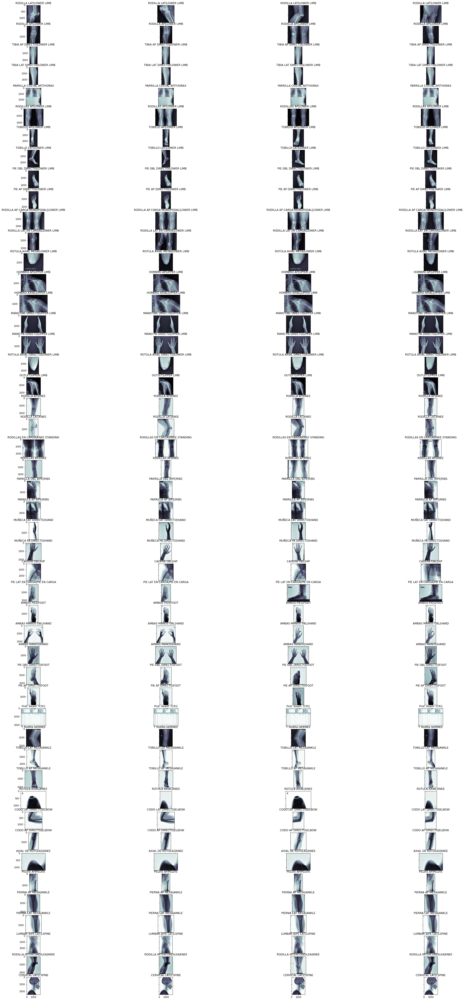

In [17]:
# df_match = pivot_df
df_match = get_each_case_samples(df, ['SeriesDescription', 'BodyPartExamined'], max_samples_per_case=4)
plot_DCMs(df_match['fname'], n_cols=[4], figsize=(80,160))

In [10]:
# Check starts with
correct_check_DICOM_dict = {
    'SeriesDescription': ['RODILLA AP', 'RODILLAS AP', 'PIERNA AP MESA'],
    'BodyPartExamined': ['LOWER LIMB', 'KNEE']
}

doubt_check_DICOM_dict = {
    'SeriesDescription': ['RODILLA INTERCONDILEA', 'RODILLA AP CARGA MONOPODAL', 'RODILLAS EN CARGA', 'T Rodilla lat', 'PIERNA AP MESA']
}

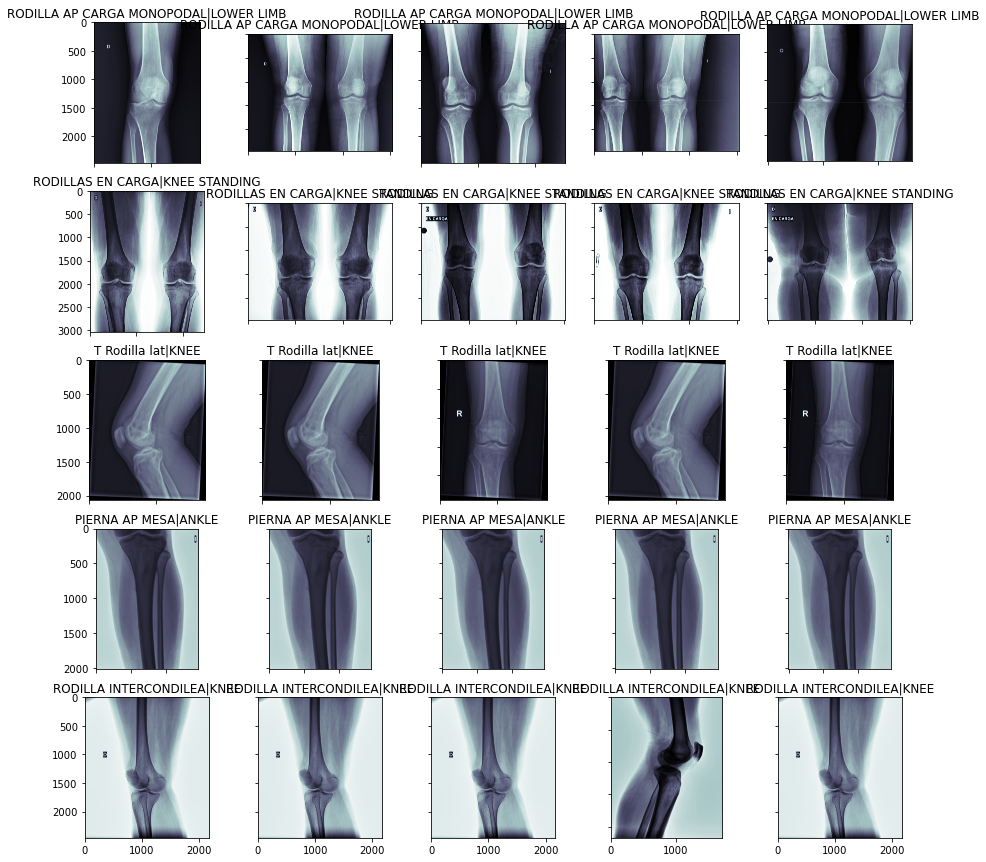

In [11]:
# df_match = df_check_DICOM(df, doubt_check_DICOM_dict)
df_match = sample_df_check_DICOM(df, doubt_check_DICOM_dict, max_samples_per_case=5)
plot_DCMs(df_match['fname'], n_cols=[5])

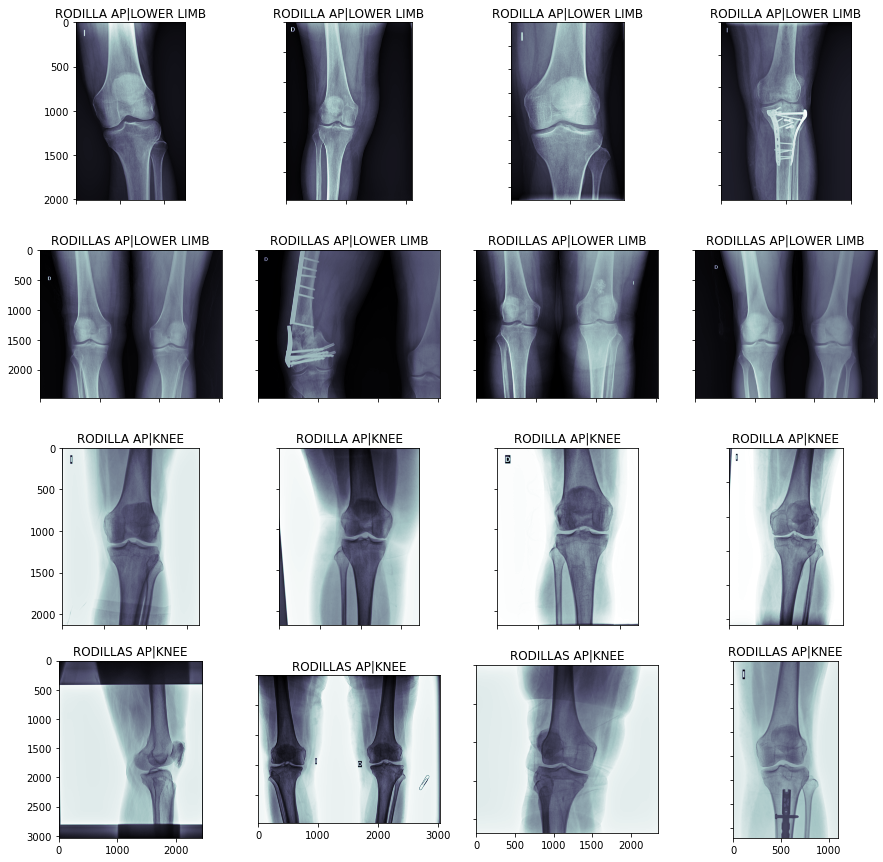

In [15]:
# df_match = df_check_DICOM(df, correct_check_DICOM_dict)
df_match = sample_df_check_DICOM(df, correct_check_DICOM_dict, max_samples_per_case=4)
plot_DCMs(df_match['fname'], n_cols=[4])

## Filtered Data EDA

In [7]:
# Transform metadata to DataFrame
df = pd.DataFrame.from_dicoms(
    get_files(organize_folder, extensions='.dcm')
)

█

In [21]:
metadata_save_path = PATH_PREFIX + 'metadata_pending_class.csv'

In [22]:
df = pd.read_csv(metadata_save_path)
# df.to_csv(metadata_save_path)

In [49]:
df.loc[df['Laterality'].isnull(),'Laterality'] = ''

In [61]:
df.columns[df.columns.str.startswith('Tra')]

Index([], dtype='object')

In [65]:
# df['combo'] = (df['Laterality'].astype('string')+df['InstanceNumber'].astype('string'))
df['DetectorType'].value_counts()

SCINTILLATOR    420
FDX4343RPW      185
FDX3543RPW      153
Name: DetectorType, dtype: int64

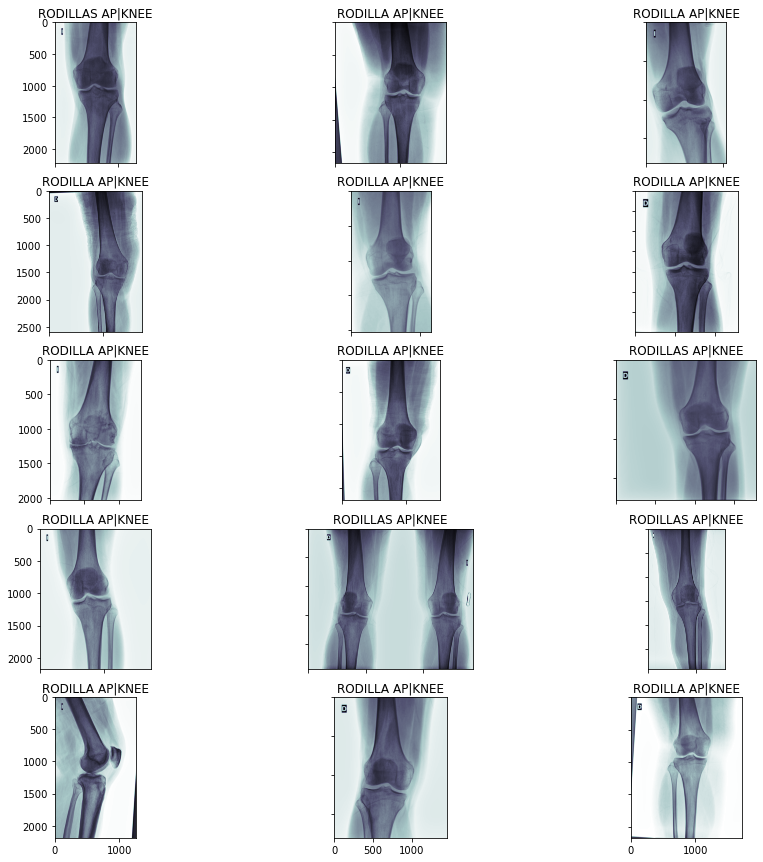

In [55]:
plot_DCMs(df[df['combo'].isin(['R2.0'])]['fname'], n_cols=[3])

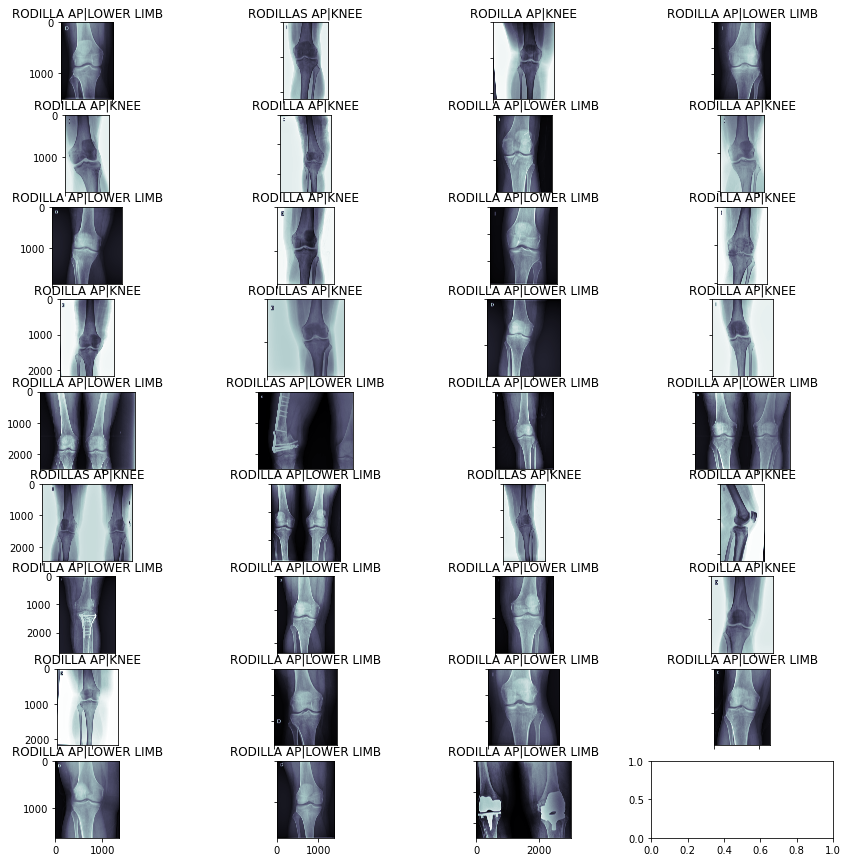

In [37]:
plot_DCMs(df[df['InstanceNumber'] > 2]['fname'], n_cols=[4])

In [66]:
repr_flds = ['DetectorType'] + ['SeriesDescription','BodyPartExamined']
display(df.pivot_table(values=['img_mean','img_max','img_min','PatientID'], index=repr_flds,
                   aggfunc={'img_mean':'mean','img_max':'max','img_min':'min','PatientID':'count'}))
display(df.pivot_table(values=['WindowCenter','WindowWidth', 'RescaleIntercept', 'RescaleSlope'], index=repr_flds,
                   aggfunc={'mean','max','min','std','median'}))

PatientID  img_max  \
DetectorType SeriesDescription BodyPartExamined                       
FDX3543RPW   RODILLA AP        LOWER LIMB               91     4094   
             RODILLAS AP       LOWER LIMB               62     4095   
FDX4343RPW   RODILLA AP        LOWER LIMB              184     4091   
             RODILLAS AP       LOWER LIMB                1     4071   
SCINTILLATOR RODILLA AP        KNEE                    361     4095   
             RODILLAS AP       KNEE                     59     4095   

                                                    img_mean  img_min  
DetectorType SeriesDescription BodyPartExamined                        
FDX3543RPW   RODILLA AP        LOWER LIMB        1279.556792        3  
             RODILLAS AP       LOWER LIMB        1296.395609        1  
FDX4343RPW   RODILLA AP        LOWER LIMB        1314.931576        3  
             RODILLAS AP       LOWER LIMB        1701.237045      273  
SCINTILLATOR RODILLA AP        KNEE              2918.654298        0  
             RODILLAS AP       KNEE              2736.047988        0

RescaleIntercept              \
                                                             max mean median   
DetectorType SeriesDescription BodyPartExamined                                
FDX3543RPW   RODILLA AP        LOWER LIMB                    0.0  0.0    0.0   
             RODILLAS AP       LOWER LIMB                    0.0  0.0    0.0   
FDX4343RPW   RODILLA AP        LOWER LIMB                    0.0  0.0    0.0   
             RODILLAS AP       LOWER LIMB                    0.0  0.0    0.0   
SCINTILLATOR RODILLA AP        KNEE                          0.0  0.0    0.0   
             RODILLAS AP       KNEE                          0.0  0.0    0.0   

                                                          RescaleSlope       \
                                                 min  std          max mean   
DetectorType SeriesDescription BodyPartExamined                               
FDX3543RPW   RODILLA AP        LOWER LIMB        0.0  0.0          1.0  1.0   
             RODILLAS AP       LOWER LIMB        0.0  0.0          1.0  1.0   
FDX4343RPW   RODILLA AP        LOWER LIMB        0.0  0.0          1.0  1.0   
             RODILLAS AP       LOWER LIMB        0.0  NaN          1.0  1.0   
SCINTILLATOR RODILLA AP        KNEE              0.0  0.0          1.0  1.0   
             RODILLAS AP       KNEE              0.0  0.0          1.0  1.0   

                                                                 WindowCenter  \
                                                median  min  std          max   
DetectorType SeriesDescription BodyPartExamined                                 
FDX3543RPW   RODILLA AP        LOWER LIMB          1.0  1.0  0.0       2048.0   
             RODILLAS AP       LOWER LIMB          1.0  1.0  0.0       2048.0   
FDX4343RPW   RODILLA AP        LOWER LIMB          1.0  1.0  0.0       2048.0   
             RODILLAS AP       LOWER LIMB          1.0  1.0  NaN       2048.0   
SCINTILLATOR RODILLA AP        KNEE                1.0  1.0  0.0       2048.0   
             RODILLAS AP       KNEE                1.0  1.0  0.0       2048.0   

                                                                              \
                                                   mean  median     min  std   
DetectorType SeriesDescription BodyPartExamined                                
FDX3543RPW   RODILLA AP        LOWER LIMB        2048.0  2048.0  2048.0  0.0   
             RODILLAS AP       LOWER LIMB        2048.0  2048.0  2048.0  0.0   
FDX4343RPW   RODILLA AP        LOWER LIMB        2048.0  2048.0  2048.0  0.0   
             RODILLAS AP       LOWER LIMB        2048.0  2048.0  2048.0  NaN   
SCINTILLATOR RODILLA AP        KNEE              2048.0  2048.0  2048.0  0.0   
             RODILLAS AP       KNEE              2048.0  2048.0  2048.0  0.0   

                                                WindowWidth                  \
                                                        max    mean  median   
DetectorType SeriesDescription BodyPartExamined                               
FDX3543RPW   RODILLA AP        LOWER LIMB            4096.0  4096.0  4096.0   
             RODILLAS AP       LOWER LIMB            4096.0  4096.0  4096.0   
FDX4343RPW   RODILLA AP        LOWER LIMB            4096.0  4096.0  4096.0   
             RODILLAS AP       LOWER LIMB            4096.0  4096.0  4096.0   
SCINTILLATOR RODILLA AP        KNEE                  4096.0  4096.0  4096.0   
             RODILLAS AP       KNEE                  4096.0  4096.0  4096.0   

                                                              
                                                    min  std  
DetectorType SeriesDescription BodyPartExamined               
FDX3543RPW   RODILLA AP        LOWER LIMB        4096.0  0.0  
             RODILLAS AP       LOWER LIMB        4096.0  0.0  
FDX4343RPW   RODILLA AP        LOWER LIMB        4096.0  0.0  
             RODILLAS AP       LOWER LIMB        4096.0  NaN  
SCINTILLATO

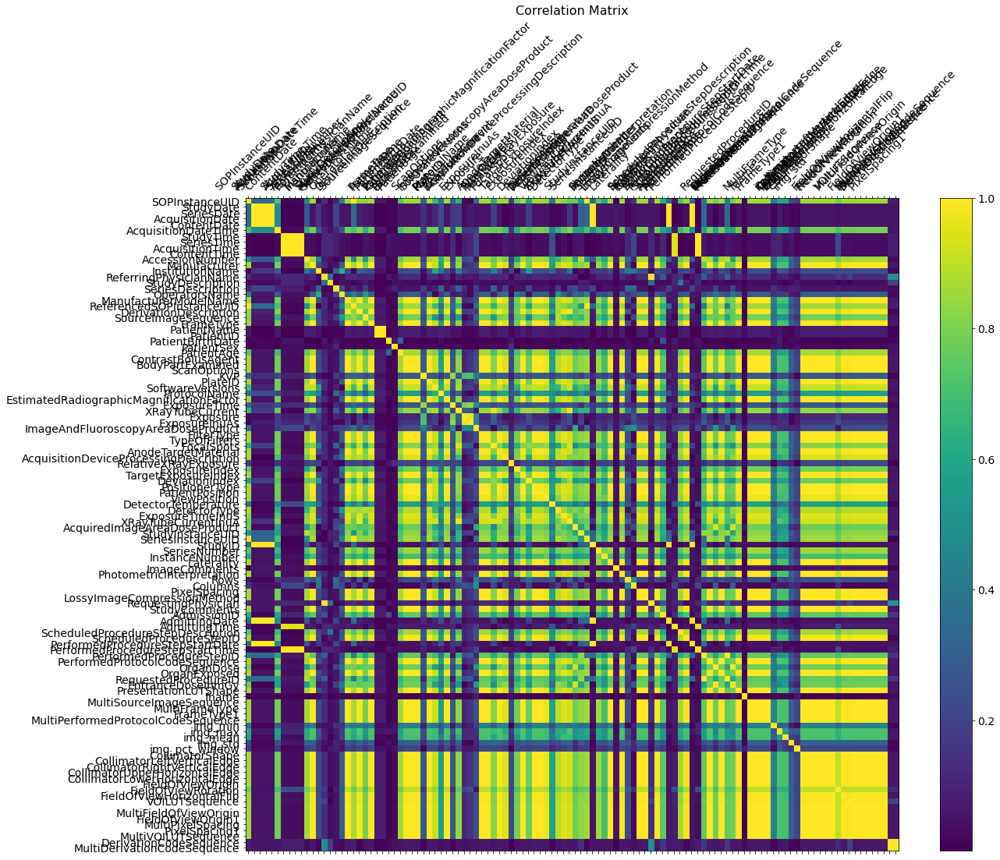

In [9]:
corr = df.astype('string').astype('category').apply(lambda x: x.cat.codes, axis=0).corr()

corr = corr.loc[corr.notnull().any(axis=0),corr.notnull().any(axis=1)].abs()

f = plt.figure(figsize=(19, 15))
plt.matshow(corr, fignum=f.number)
plt.xticks(range(corr.shape[1]), corr.columns, fontsize=14, rotation=45)
plt.yticks(range(corr.shape[1]), corr.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);
plt.show()

The DeviationIndex seems to be a potential features related to the `img_mean` and `img_std`

When `PresentationLUTShape` is `INVERSE` then a transformation like $(Pixels - WindowWidth) * (-1)$ should be done